In [22]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/socofing/SOCOFing/Real/171__M_Left_little_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/463__F_Right_ring_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/470__F_Right_ring_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/367__M_Left_index_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/446__M_Right_index_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/349__M_Left_index_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/127__F_Left_middle_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/277__M_Right_ring_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/308__M_Left_ring_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/334__F_Left_thumb_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/20__M_Right_little_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/26__M_Right_thumb_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/86__M_Left_middle_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/431__M_Left_ring_finger.BMP
/kaggle/input/socofing/SOCOFing/Real/434__M_Left_thumb_finger.BMP
/kaggle/

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

import os
import cv2
import random

import matplotlib.pyplot as plt

In [24]:
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.layers import Dense, Dropout,Activation, Flatten, Conv2D, MaxPool2D
from tensorflow.keras.utils import to_categorical # convert to one-hot-encoding
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau

from sklearn.model_selection import train_test_split

In [26]:
def extract_label(img_path,train = True):
    filename, _ = os.path.splitext(os.path.basename(img_path))

    subject_id, etc = filename.split('__')
    
    if train:
        gender, lr, finger, _, _ = etc.split('_')
    else:
        gender, lr, finger, _ = etc.split('_')
    
    gender = 0 if gender == 'M' else 1
    lr = 0 if lr == 'Left' else 1

    if finger == 'thumb':
        finger = 0
    elif finger == 'index':
        finger = 1
    elif finger == 'middle':
        finger = 2
    elif finger == 'ring':
        finger = 3
    elif finger == 'little':
        finger = 4
    
    return np.array([subject_id, gender, lr, finger], dtype=np.uint16)

In [27]:
img_size = 96

def loading_data(path,train):
    print("loading data from: ",path)
    data = []
    for img in os.listdir(path):
        try:
            img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE)
            img_resize = cv2.resize(img_array, (img_size, img_size))
            label = extract_label(os.path.join(path, img),train)
            data.append([label[1], img_resize ])
        except Exception as e:
            pass
    data
    return data

In [28]:
Real_path = "../input/socofing/SOCOFing/Real"
Easy_path = "../input/socofing/SOCOFing/Altered/Altered-Easy"
Medium_path = "../input/socofing/SOCOFing/Altered/Altered-Medium"
Hard_path = "../input/socofing/SOCOFing/Altered/Altered-Hard"

Easy_data = loading_data(Easy_path, train = True)
Medium_data = loading_data(Medium_path, train = True)
Hard_data = loading_data(Hard_path, train = True)
test = loading_data(Real_path, train = False)

data = np.concatenate([Easy_data, Medium_data, Hard_data], axis=0)

del Easy_data, Medium_data, Hard_data

loading data from:  ../input/socofing/SOCOFing/Altered/Altered-Easy
loading data from:  ../input/socofing/SOCOFing/Altered/Altered-Medium
loading data from:  ../input/socofing/SOCOFing/Altered/Altered-Hard
loading data from:  ../input/socofing/SOCOFing/Real


In [29]:
X, y = [], []

for label, feature in data:
    X.append(feature)
    y.append(label)
    
del data

X = np.array(X).reshape(-1, img_size, img_size, 1)
X = X / 255.0

y = np.array(y)

In [30]:
X_test, y_test = [], []

for label, feature in test:
    X_test.append(feature)
    y_test.append(label)
    
del test    
X_test = np.array(X_test).reshape(-1, img_size, img_size, 1)
X_test = X_test / 255.0

y_test = np.array(y_test)

In [31]:
#data set train and test
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=1)

In [32]:
print("full data:  ",X.shape)
del X, y
print("Train:      ",X_train.shape)
print("Validation: ",X_val.shape)
print("Test:       ",X_test.shape)

full data:   (49270, 96, 96, 1)
Train:       (39416, 96, 96, 1)
Validation:  (9854, 96, 96, 1)
Test:        (6000, 96, 96, 1)


In [33]:
model = Sequential()

model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu', input_shape = (96,96,1)))
model.add(Conv2D(filters = 32, kernel_size = (5,5),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))


model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', 
                 activation ='relu'))
model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same', 
                 activation ='relu'))
model.add(MaxPool2D(pool_size=(2,2), strides=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten())
model.add(Dense(100, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(1, activation = "sigmoid"))

model.summary()

2022-05-17 01:17:05.293548: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 96, 96, 32)        832       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 32)        25632     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 48, 48, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 48, 48, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 48, 48, 64)        36928     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 24, 24, 64)        0

2022-05-17 01:17:05.418453: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-17 01:17:05.419218: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-05-17 01:17:05.420455: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-05-17 01:17:05.420746: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA 

In [34]:
epochs = 5 # Turn epochs to 30 to get 0.9967 accuracy
batch_size = 32
model_path = './Model.h5'


model.compile(optimizer = 'adam' , loss = "binary_crossentropy", metrics=["accuracy"])

callbacks = [
    EarlyStopping(monitor='val_acc', patience=20, mode='max', verbose=1),
    ModelCheckpoint(model_path, monitor='val_acc', save_best_only=True, mode='max', verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1)
]


history = model.fit(X_train, y_train, batch_size = batch_size, epochs = epochs, 
          validation_data = (X_val, y_val), verbose = 1, callbacks= callbacks)

2022-05-17 01:17:13.037997: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1453031424 exceeds 10% of free system memory.
2022-05-17 01:17:14.481116: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1453031424 exceeds 10% of free system memory.
2022-05-17 01:17:15.542804: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


Epoch 1/5


2022-05-17 01:17:17.034736: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


1232/1232 [==============================] - 29s 17ms/step - loss: 0.4688 - accuracy: 0.8001 - val_loss: 0.4786 - val_accuracy: 0.7993
Epoch 2/5
1232/1232 [==============================] - 20s 16ms/step - loss: 0.4231 - accuracy: 0.8006 - val_loss: 0.3815 - val_accuracy: 0.7993
Epoch 3/5
1232/1232 [==============================] - 20s 16ms/step - loss: 0.3542 - accuracy: 0.8304 - val_loss: 0.2983 - val_accuracy: 0.8656
Epoch 4/5
1232/1232 [==============================] - 20s 16ms/step - loss: 0.2718 - accuracy: 0.8810 - val_loss: 0.1932 - val_accuracy: 0.9378
Epoch 5/5
1232/1232 [==============================] - 20s 16ms/step - loss: 0.2094 - accuracy: 0.9150 - val_loss: 0.1362 - val_accuracy: 0.9508


In [35]:
layer_name = "dense"
feature_model = Model(inputs=model.input, outputs=model.get_layer(layer_name).output)

feature_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_input (InputLayer)    [(None, 96, 96, 1)]       0         
_________________________________________________________________
conv2d (Conv2D)              (None, 96, 96, 32)        832       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 96, 96, 32)        25632     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 48, 48, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 48, 48, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 48, 48, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 48, 48, 64)        36928 

In [36]:
X_feature_train=feature_model.predict(X_train)

2022-05-17 01:19:49.199035: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1453031424 exceeds 10% of free system memory.
2022-05-17 01:19:50.845651: W tensorflow/core/framework/cpu_allocator_impl.cc:80] Allocation of 1453031424 exceeds 10% of free system memory.


In [37]:
X_feature_train.shape

(39416, 100)

In [38]:
from sklearn.svm import SVC

In [39]:
clf=SVC()
clf.fit(X_feature_train, y_train)

SVC()

In [40]:
clf.score(X_feature_train, y_train)

0.9809214532169678

In [41]:
from sklearn.metrics import confusion_matrix

In [42]:
x_feature_val=feature_model.predict(X_val)
clf.score(x_feature_val, y_val)


0.9668155063933428

In [44]:
x_feature_test=feature_model.predict(X_test)
clf.score(x_feature_test, y_test)

0.9853333333333333

In [58]:
y_true = y_train
y_svm_pred = clf.predict(X_feature_train)
cm_svm = confusion_matrix(y_true,y_svm_pred)

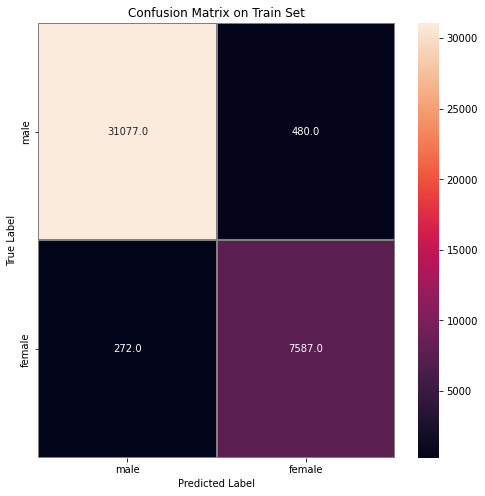

In [59]:
f,ax = plt.subplots(figsize=(8, 8))
label_map = ("male","female")
sns.heatmap(cm_svm, annot=True, linewidths=0.01,linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix on Train Set")
ax.xaxis.set_ticklabels(label_map);
ax.yaxis.set_ticklabels(label_map);
plt.show()

In [ ]:
f,ax = plt.subplots(figsize=(12, 12))
label_map = ("male","female")
sns.heatmap(cm_svm, annot=True, linewidths=0.01,linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix on Test Set")
ax.xaxis.set_ticklabels(label_map);
ax.yaxis.set_ticklabels(label_map);
plt.show()

In [60]:
y_true = y_test
y_svm_pred = clf.predict(x_feature_test)
cm_svm = confusion_matrix(y_true,y_svm_pred)

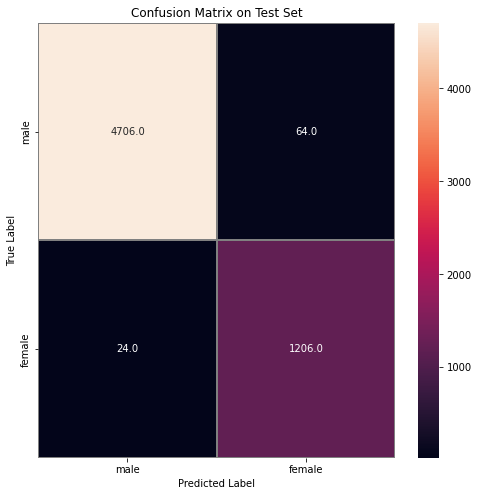

In [61]:
f,ax = plt.subplots(figsize=(8, 8))
label_map = ("male","female")
sns.heatmap(cm_svm, annot=True, linewidths=0.01,linecolor="gray", fmt= '.1f',ax=ax)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix on Test Set")
ax.xaxis.set_ticklabels(label_map);
ax.yaxis.set_ticklabels(label_map);
plt.show()


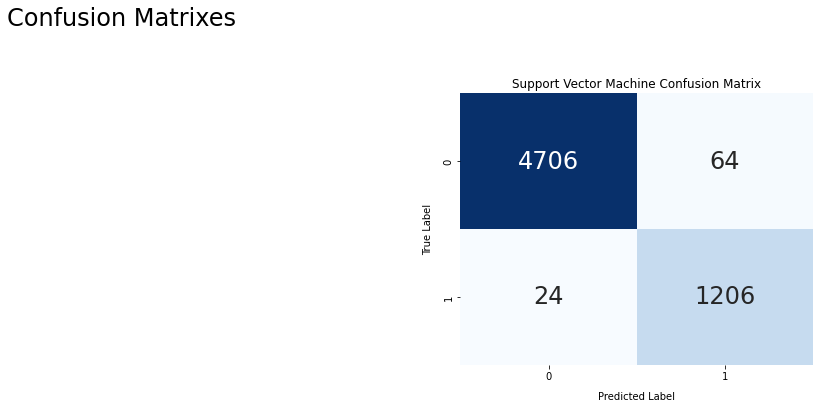

In [46]:

plt.figure(figsize=(24,12))

plt.suptitle("Confusion Matrixes",fontsize=24)
plt.subplots_adjust(wspace = 0.4, hspace= 0.4)


plt.subplot(2,3,3)
plt.title("Support Vector Machine Confusion Matrix")
sns.heatmap(cm_svm,annot=True,cmap="Blues",fmt="d",cbar=False, annot_kws={"size": 24})
plt.ylabel('True Label',labelpad=10)
plt.xlabel('Predicted Label',labelpad=10)
plt.show()